# Imports

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime as dt
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls
/kaggle/input/uk-accidents-10-years-history-with-many-variables/Accidents0514.csv
/kaggle/input/uk-accidents-10-years-history-with-many-variables/Vehicles0514.csv
/kaggle/input/uk-accidents-10-years-history-with-many-variables/Casualties0514.csv


In [2]:
casualties=pd.read_csv("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Casualties0514.csv")
accidents=pd.read_csv("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Accidents0514.csv")
vehicles=pd.read_csv("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Vehicles0514.csv")
lookup=pd.ExcelFile("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls")

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (31) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
#Preprocessing
accidents['Latitude'] = accidents['Latitude'].astype(float)
accidents['Date']= accidents['Date'].astype('datetime64')
accidents['Longitude'] = accidents['Longitude'].astype(float)
heat_df = accidents[['Latitude', 'Longitude']]
heat_df = heat_df.dropna(axis=0, subset=['Latitude','Longitude'])
#Generate Heatmap from  sample of 250k values
heat_data = heat_df.sample(250000).values
#m = folium.Map(location=[51.5074, 0.1278],width='100%', height="100%", zoom_start=7.5)
#m


# Heatmap of accidents around the UK

In [4]:
#Heatmap
import folium
from folium.plugins import HeatMap
m = folium.Map(location=[54.251186, -4.463196],width=800,height=700, min_zoom=5, max_zoom=18, zoom_start=6, min_lat=48, max_lat=60, min_lon=-13, max_lon=4,
    control_scale=False,
    zoom_control=False)
HeatMap(heat_data,radius=9.5).add_to(m)
m

In [5]:
#Merge Weather by code
weather = accidents["Weather_Conditions"].value_counts(dropna =False)
weather_lookup = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls",sheet_name="Weather")
merged_weather = pd.merge(weather, weather_lookup, left_index=True, right_on='code')
merged_weather= merged_weather[merged_weather["Weather_Conditions"]>5000] #We only take the values greater than a specific threshold
merged_weather

,Weather_Conditions,code,label
0,1309195,1,Fine no high winds
1,194930,2,Raining no high winds
7,37179,8,Other
8,31651,9,Unknown
4,23490,5,Raining + high winds
3,20960,4,Fine + high winds
2,11860,3,Snowing no high winds
6,9037,7,Fog or mist


Text(0.5, 1.0, 'Number of Accidents Given Weather Condition')

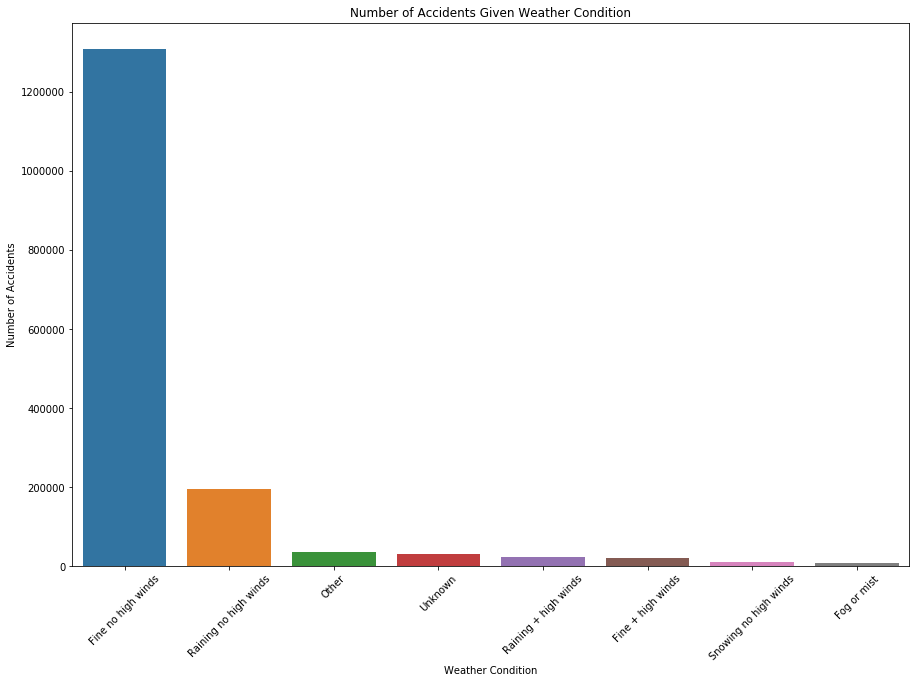

In [6]:
#Plot of Weather Condition vs Number of accidents
plt.figure(figsize=(15,10))
sns.barplot(x=merged_weather["label"], y=merged_weather["Weather_Conditions"])
plt.xticks(rotation= 45)
plt.xlabel('Weather Condition')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents Given Weather Condition')

Here we find that the accidents, is not correlated with the weather as most of the accidents happen with very good weather

In [7]:
# Corelation of Weather with other variables
weather_corr = accidents.corr()["Weather_Conditions"][accidents.corr()["Weather_Conditions"] !=1].sort_values()
weather_corr

Junction_Control                              -0.028036
2nd_Road_Class                                -0.028032
Location_Easting_OSGR                         -0.027712
Longitude                                     -0.027693
Pedestrian_Crossing-Physical_Facilities       -0.022275
Number_of_Vehicles                            -0.019806
Junction_Detail                               -0.018555
Number_of_Casualties                          -0.004690
Day_of_Week                                   -0.000786
Pedestrian_Crossing-Human_Control             -0.000636
2nd_Road_Number                               -0.000147
Road_Type                                      0.004289
Carriageway_Hazards                            0.007871
1st_Road_Number                                0.010632
1st_Road_Class                                 0.011048
Latitude                                       0.018521
Location_Northing_OSGR                         0.018590
Special_Conditions_at_Site                     0

Text(0.5, 1.0, 'The relationship of weather with other features')

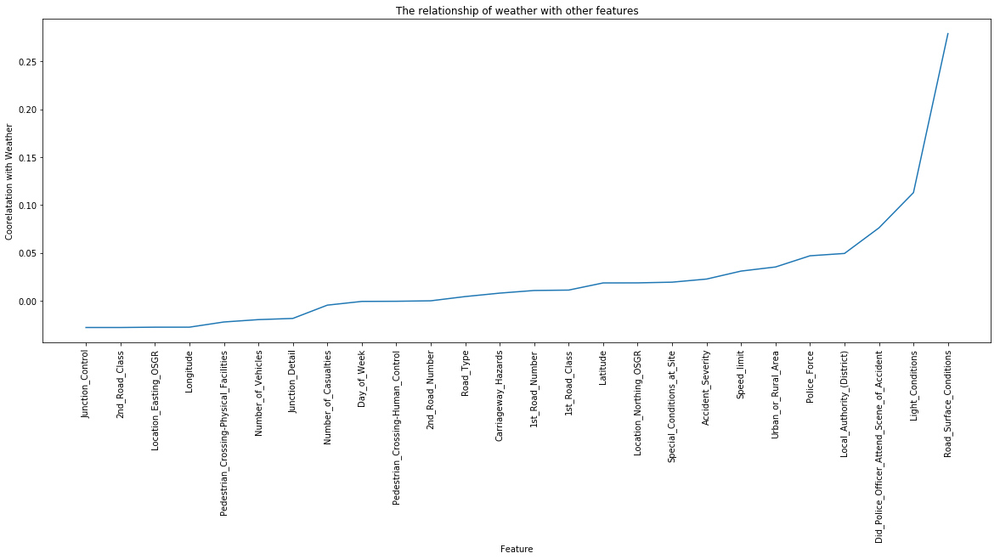

In [8]:
#Correlation plot
plt.figure(figsize=(20,7))
ax = sns.lineplot(data=weather_corr, sort=False)
plt.xticks(rotation= 90)
plt.xlabel('Feature')
plt.ylabel('Coorelatation with Weather')
plt.title('The relationship of weather with other features')

As we can tell from this plot, only the Road Surface Conditions and Light conditions are correlated with weather which makes sense, since weather affects both of them, so based on this piece of information, and our other plot we can come to the conclusion that the weather doesn't really affect the accident conditions. So if we'd rather invest in other areas to help reduce accidents

In [9]:
#Merge Ageband by code
age_band = vehicles["Age_Band_of_Driver"].value_counts(dropna =False)
age_band_lookup = pd.read_excel("/kaggle/input/uk-accidents-10-years-history-with-many-variables/Road-Accident-Safety-Data-Guide.xls",sheet_name="Age Band")
merged_age_band = pd.merge(age_band, age_band_lookup, left_index=True, right_on='code')
merged_age_band = merged_age_band[merged_age_band["code"]!=-1]
merged_age_band

,Age_Band_of_Driver,code,label
5,605096,6,26 - 35
6,573547,7,36 - 45
7,418361,8,46 - 55
4,336044,5,21 - 25
3,292711,4,16 - 20
8,246023,9,56 - 65
9,106572,10,66 - 75
10,63307,11,Over 75
2,22606,3,11 - 15
1,8632,2,6 - 10


Text(0.5, 1.0, 'Number of Accidents Given Driver Age band')

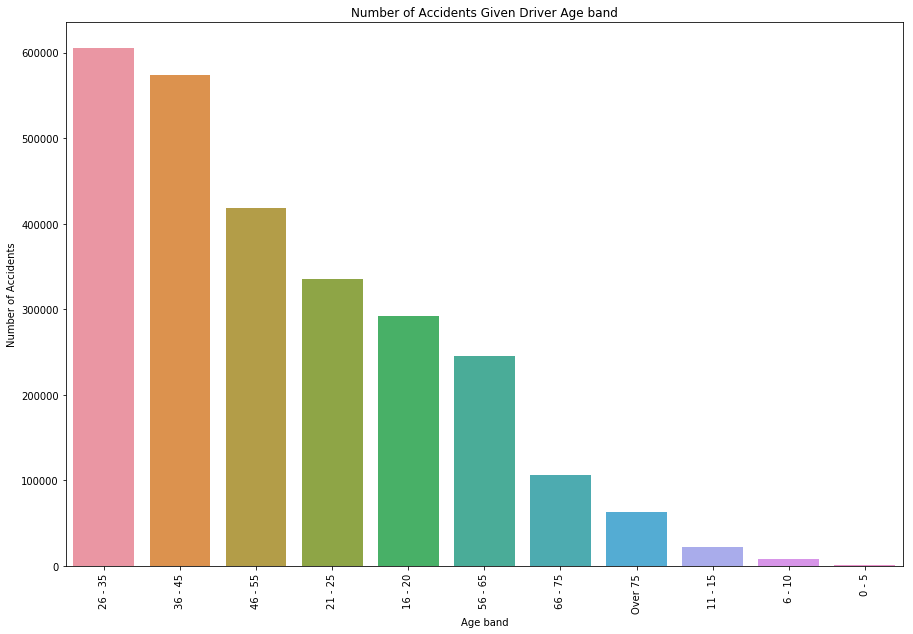

In [10]:
#Plot Driver Ageband vs Number of accidents
plt.figure(figsize=(15,10))
sns.barplot(x=merged_age_band["label"], y=merged_age_band["Age_Band_of_Driver"])
plt.xticks(rotation= 90)
plt.xlabel('Age band')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents Given Driver Age band')

As expected, it seems like the younger age bands are the most likely to be involved in accidents, probably because they are generally more careless, or could be because they are likely the most age band to be spending time driving, thus the most likely to be involved in accidents..
We can also tell, that older people 66+ seem to be unlikely to get involved in accidents probably because they are either too careful or they simply don't drive that much.

In [11]:
#Merge Casualty Age band by code
age_band_caus = casualties["Age_Band_of_Casualty"].value_counts(dropna =False)
merged_age_band_caus = pd.merge(age_band_caus, age_band_lookup, left_index=True, right_on='code')
merged_age_band_caus = merged_age_band_caus[merged_age_band_caus["code"]!=-1]
merged_age_band_caus

,Age_Band_of_Casualty,code,label
5,416604,6,26 - 35
6,359439,7,36 - 45
3,325582,4,16 - 20
4,281143,5,21 - 25
7,260983,8,46 - 55
8,158218,9,56 - 65
2,105167,3,11 - 15
9,87441,10,66 - 75
10,72506,11,Over 75
1,63913,2,6 - 10


Text(0.5, 1.0, 'Number of Accidents Given Casualty Age band')

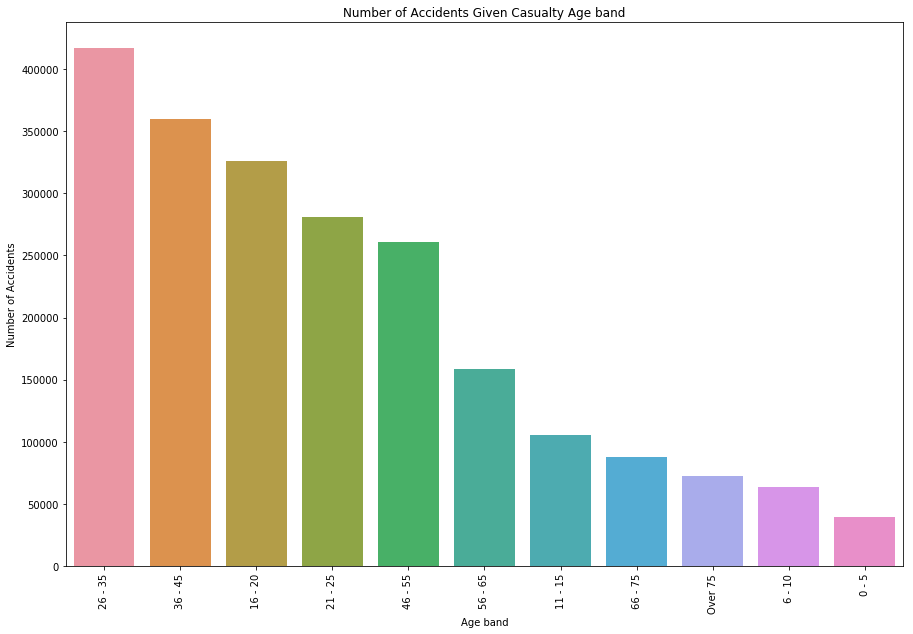

In [12]:
#Plot Casulty age band vs Number of accidents
plt.figure(figsize=(15,10))
sns.barplot(x=merged_age_band_caus["label"], y=merged_age_band_caus["Age_Band_of_Casualty"])
plt.xticks(rotation= 90)
plt.xlabel('Age band')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents Given Casualty Age band')

Interestingly, the top 2 casualty age bands happen to be the same as the top 2 driver age bands, which could strength the supposition that younger people tend to spend more time on the streets, thus effectively increasing their changes of getting in accidents whether they are the drivers of the pedestrians 

        Date  accidents
0 2005-01-01        246
1 2005-01-02        560
2 2005-01-03        521
3 2005-01-04        395
4 2005-01-05        404
<class 'pandas.core.indexes.datetimes.DatetimeIndex'> <class 'numpy.ndarray'>


/opt/conda/lib/python3.6/site-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


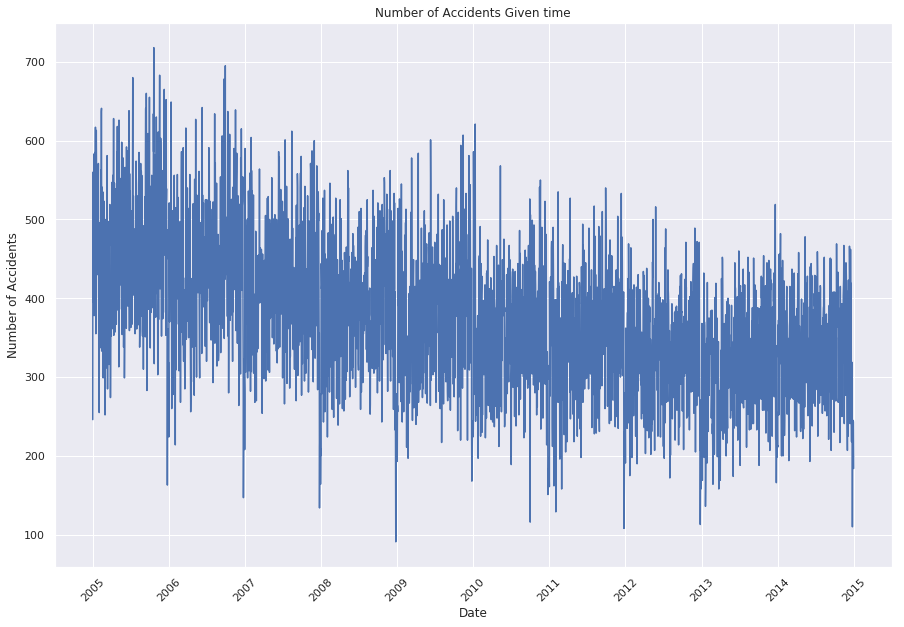

In [13]:
from statsmodels.tsa.arima_model import ARIMA
dates = pd.DataFrame.copy(accidents[accidents["Accident_Severity"]==3])
numb = np.ones(len(dates))
dates["numb"]=numb

dates["Date"] =pd.to_datetime(dates.Date,format='%d/%m/%Y')
dates=dates.sort_values("Date")
#print(dates["Date"])

# print list
count = dates.groupby(["Date"]).count() 

#print(dates,count)
times=count.filter(["Date","numb"])
ds = pd.to_datetime(dates.Date.unique())
ns = np.asarray(times.numb)
#print(ns,times)

timeser=pd.DataFrame({"Date":ds,"accidents":ns})
print(timeser.head())
print(type(ds),type(ns))

plt.figure(figsize=(15,10))
sns.set(color_codes=True)

sns.lineplot(x="Date",y="accidents",data=timeser)

plt.xticks(rotation= 45)
plt.xlabel('Date')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents Given time')
plt.show()



**The trend is intially peaked and decreasinguntil mid 2013 and then increased at a lower rate**


Text(0.5, 1.0, 'Number of Accidents Given time')

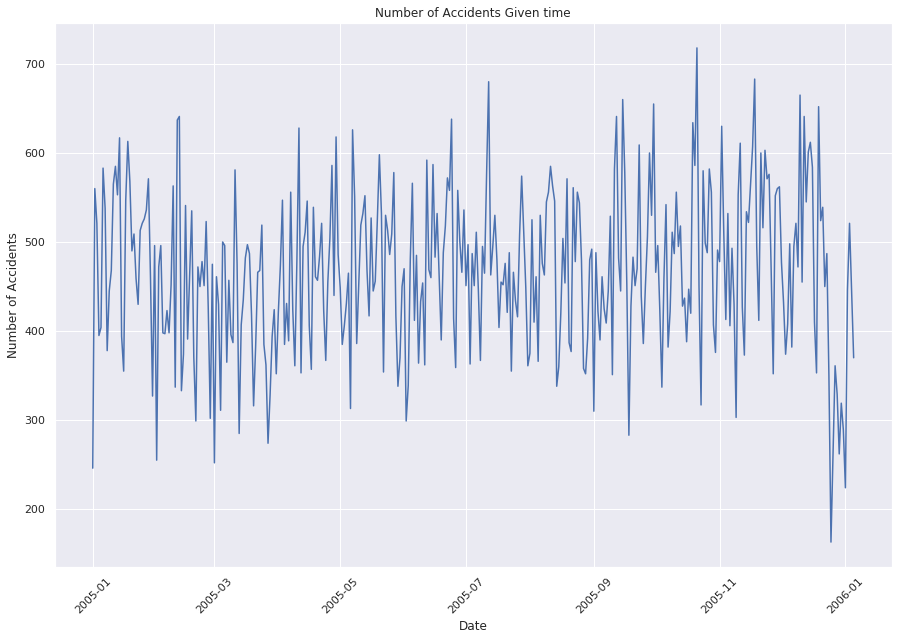

In [14]:
plt.figure(figsize=(15,10))
sns.set(color_codes=True)

sns.lineplot(x="Date",y="accidents",data=timeser[0:370])

plt.xticks(rotation= 45)
plt.xlabel('Date')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents Given time')

**Now seasonally at december of every year the accidents decrease drastically probably due to snow fall, it satrts increasing again slightly but then decreases until april, during the summer the accidents increase slightly again, and they peak at the beginning of the winter before the snowfall**

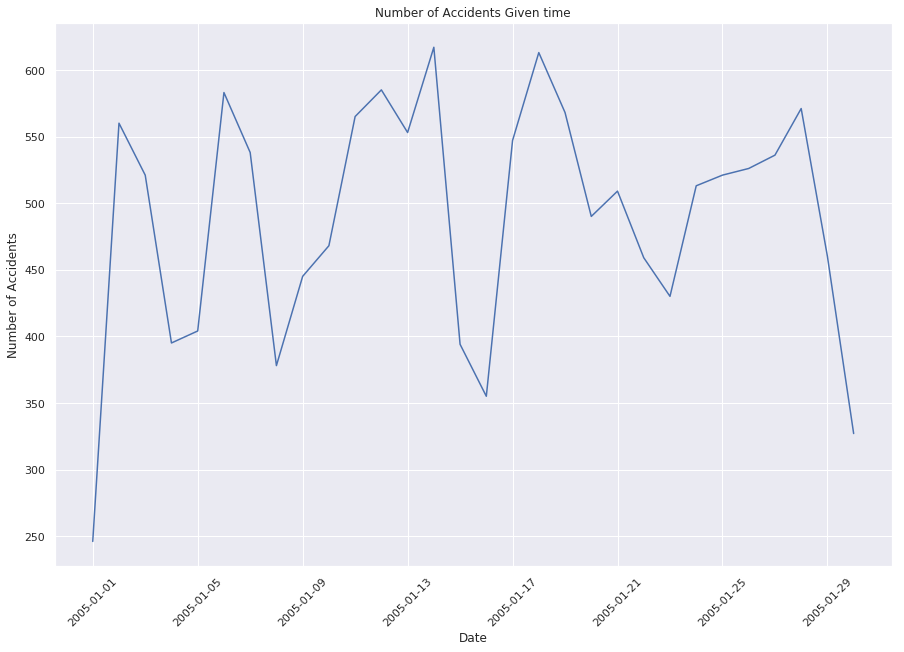

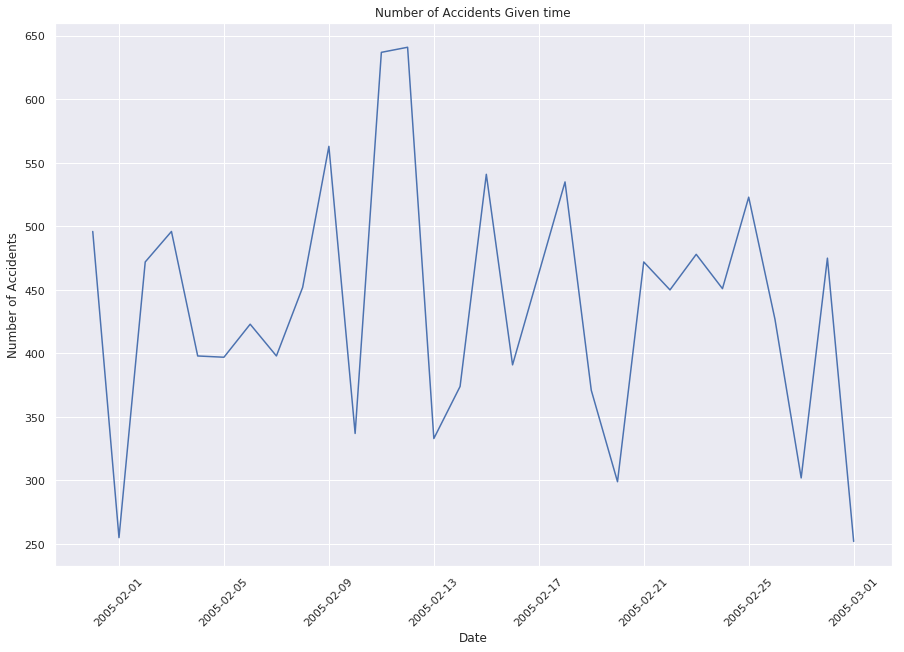

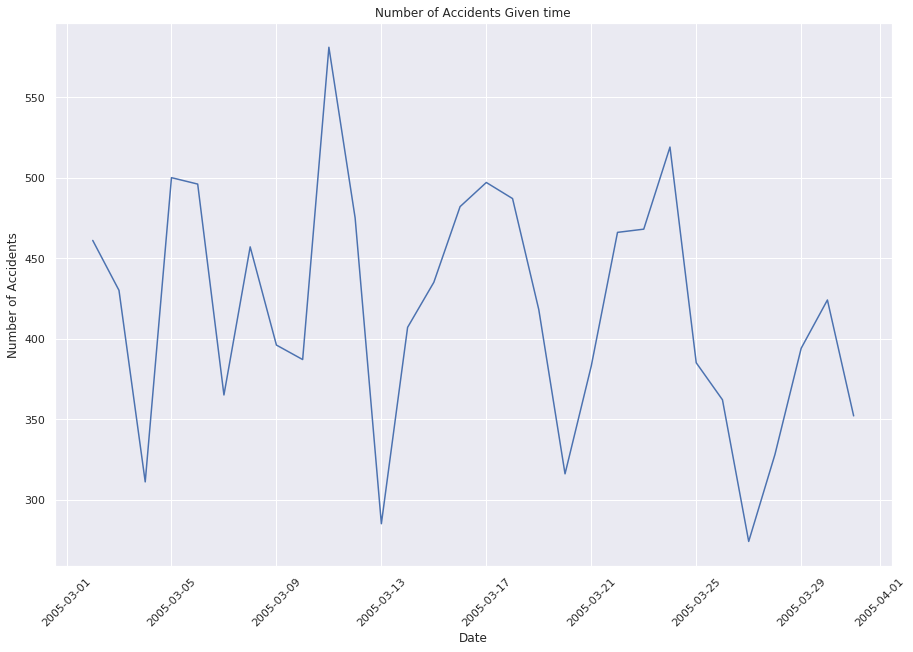

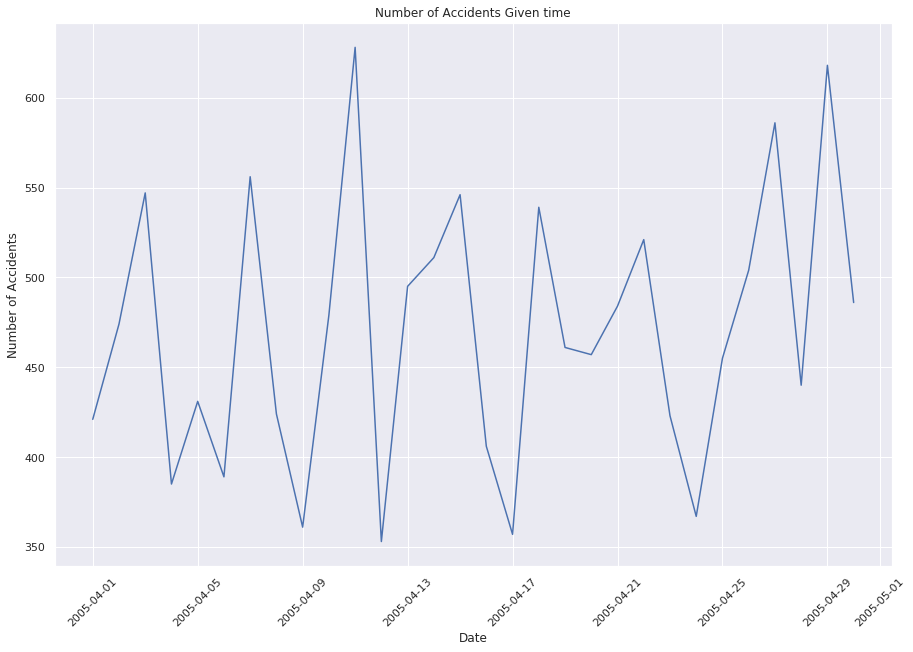

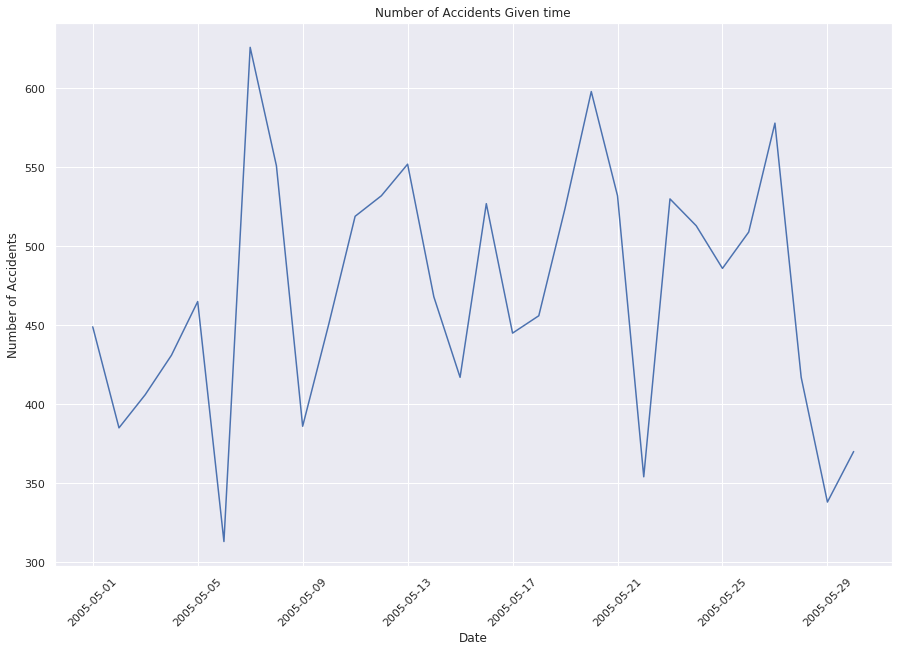

...

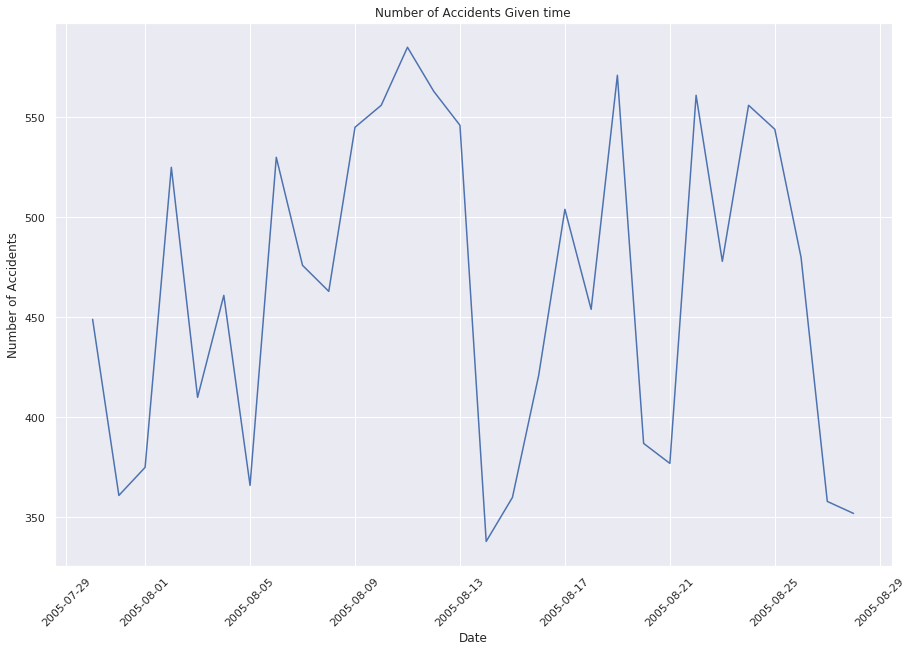

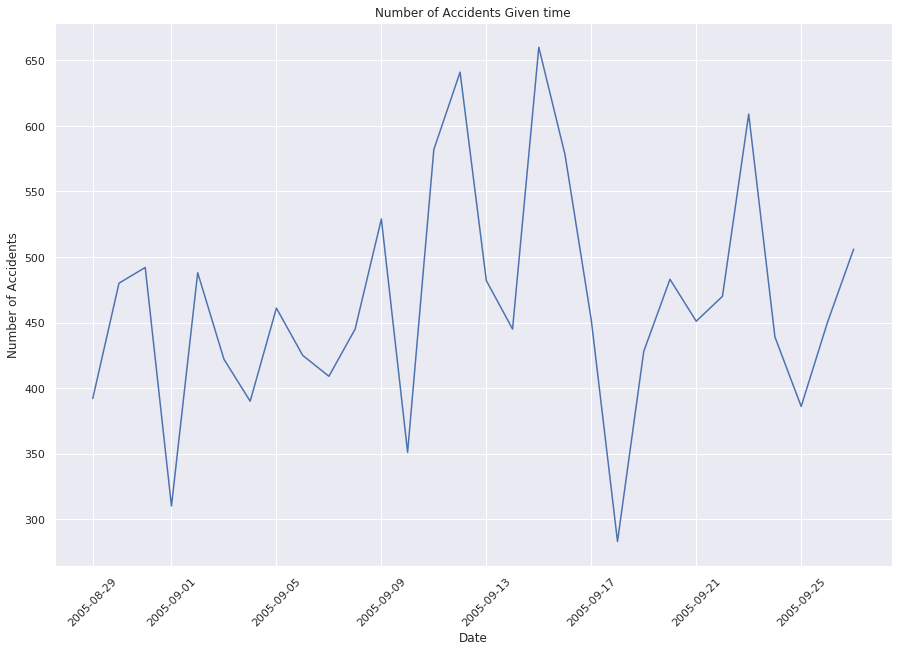

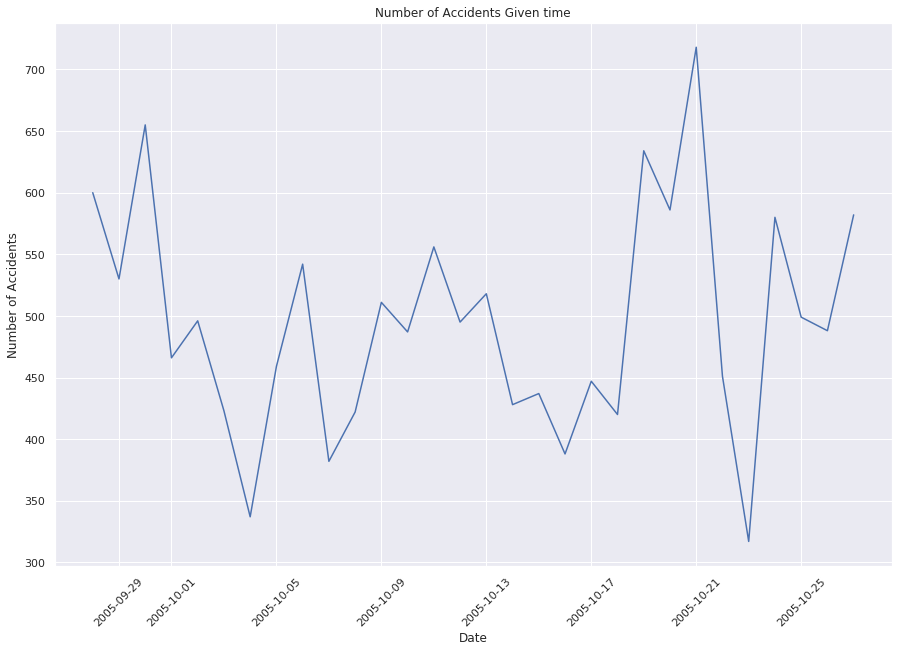

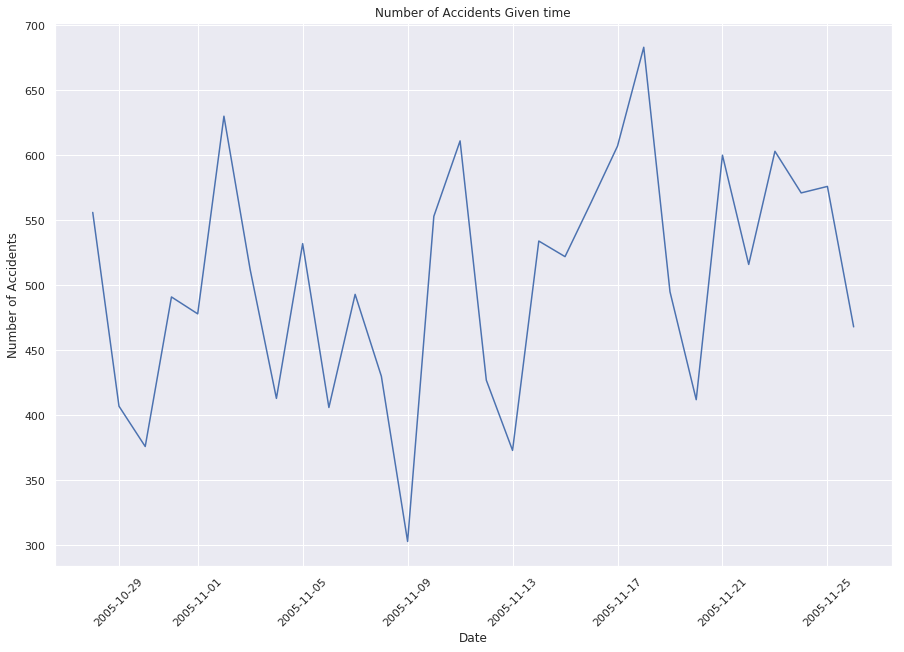

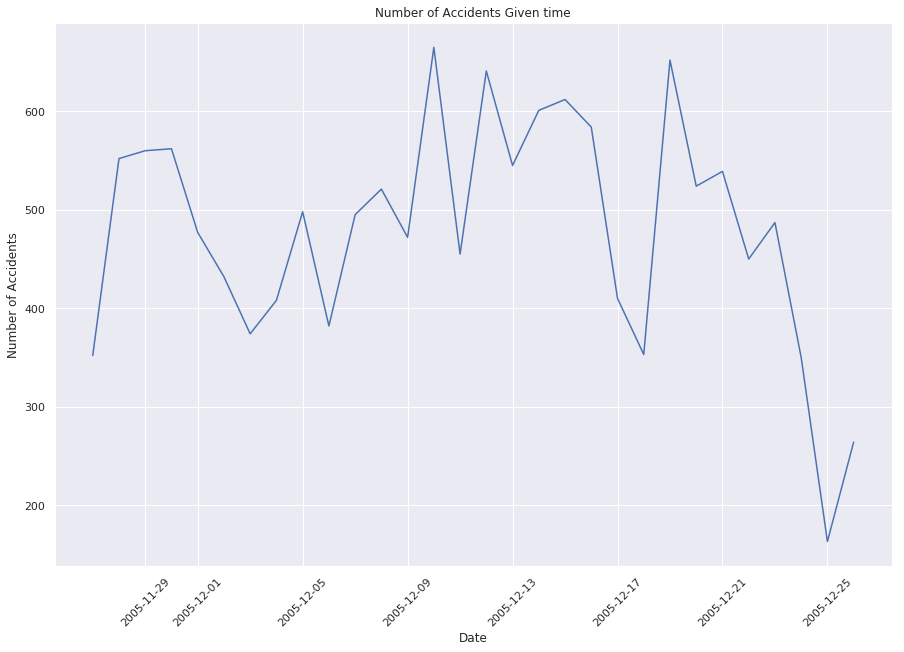

In [15]:
for i in range(12):
    plt.figure(figsize=(15,10))
    sns.set(color_codes=True)

    sns.lineplot(x="Date",y="accidents",data=timeser[30*i:30*(i+1)])

    plt.xticks(rotation= 45)
    plt.xlabel('Date')
    plt.ylabel('Number of Accidents')
    plt.title('Number of Accidents Given time')

**Now on daily basis there is no pattern for the daily number of accidents in a month**

Text(0.5, 1.0, 'Number of Accidents Given Vehicle Type')

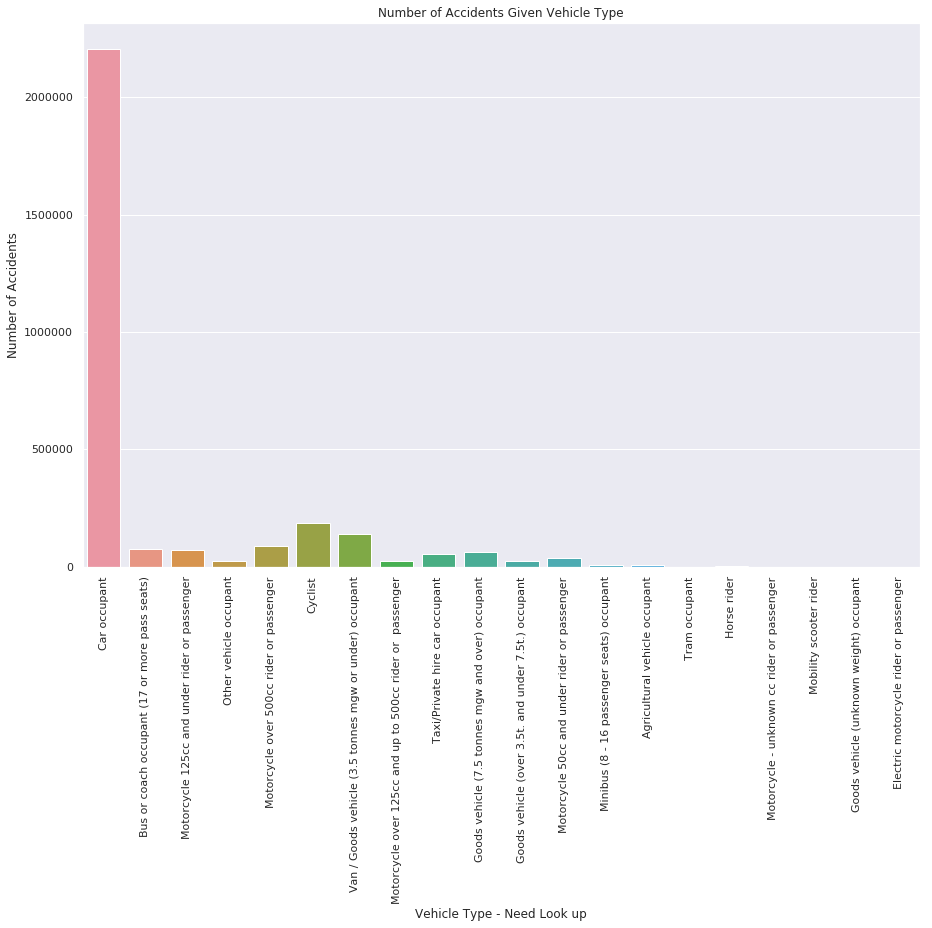

In [16]:
cars = pd.DataFrame.copy(vehicles)
#cars = cars["Vehicle_Type"].value_counts(dropna =False)
df2 = pd.read_excel(lookup,'Casualty Type')
order = df2.iloc[:,1]
case_lookup = pd.read_excel(lookup,"Casualty Type")
merged_vehicle = pd.merge(cars, case_lookup, left_on='Vehicle_Type', right_on='code')
plt.figure(figsize=(15,10))
sns.countplot(x= 'label' ,data=merged_vehicle)
plt.xticks(rotation= 90)
plt.xlabel('Vehicle Type - Need Look up')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents Given Vehicle Type')

In [17]:
cars

,Accident_Index,Vehicle_Reference,Vehicle_Type,Towing_and_Articulation,Vehicle_Manoeuvre,Vehicle_Location-Restricted_Lane,Junction_Location,Skidding_and_Overturning,Hit_Object_in_Carriageway,Vehicle_Leaving_Carriageway,...,Was_Vehicle_Left_Hand_Drive?,Journey_Purpose_of_Driver,Sex_of_Driver,Age_of_Driver,Age_Band_of_Driver,Engine_Capacity_(CC),Propulsion_Code,Age_of_Vehicle,Driver_IMD_Decile,Driver_Home_Area_Type
0,200501BS00001,1,9,0,18,0,0,0,0,0,...,1,15,2,74,10,-1,-1,-1,7,1
1,200501BS00002,1,11,0,4,0,3,0,0,0,...,1,1,1,42,7,8268,2,3,-1,-1
2,200501BS00003,1,11,0,17,0,0,0,4,0,...,1,1,1,35,6,8300,2,5,2,1
3,200501BS00003,2,9,0,2,0,0,0,0,0,...,1,15,1,62,9,1762,1,6,1,1
4,200501BS00004,1,9,0,18,0,0,0,0,0,...,1,15,2,49,8,1769,1,4,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3004420,2014984138414,1,9,0,5,0,6,0,0,0,...,1,2,1,27,6,1781,1,12,6,1
3004421,2014984138414,2,19,0,18,0,1,1,4,7,...,1,2,1,44,7,1686,2,4,1,1
3004422,2014984138414,3,9,0,18,0,2,1,4,1,...,1,6,1,73,10,2143,2,-1,8,3
3004423,2014984139614,1,11,0,9,0,8,0,0,0,...,1,1,1,40,7,4500,2,4,-1,3


**The names of the vehicles were too large to include, so 9 is oviosuly normal cars accidents, and since it blows the entire barplot out of propotion in the nect bar plot it will be excluded**

    code                                              label
0      0                                         Pedestrian
1      1                                            Cyclist
2      2       Motorcycle 50cc and under rider or passenger
3      3      Motorcycle 125cc and under rider or passenger
4      4  Motorcycle over 125cc and up to 500cc rider or...
5      5           Motorcycle over 500cc rider or passenger
6      8                     Taxi/Private hire car occupant
7      9                                       Car occupant
8     10          Minibus (8 - 16 passenger seats) occupant
9     11      Bus or coach occupant (17 or more pass seats)
10    16                                        Horse rider
11    17                      Agricultural vehicle occupant
12    18                                      Tram occupant
13    19  Van / Goods vehicle (3.5 tonnes mgw or under) ...
14    20  Goods vehicle (over 3.5t. and under 7.5t.) occ...
15    21   Goods vehicle (7.5 tonnes mgw

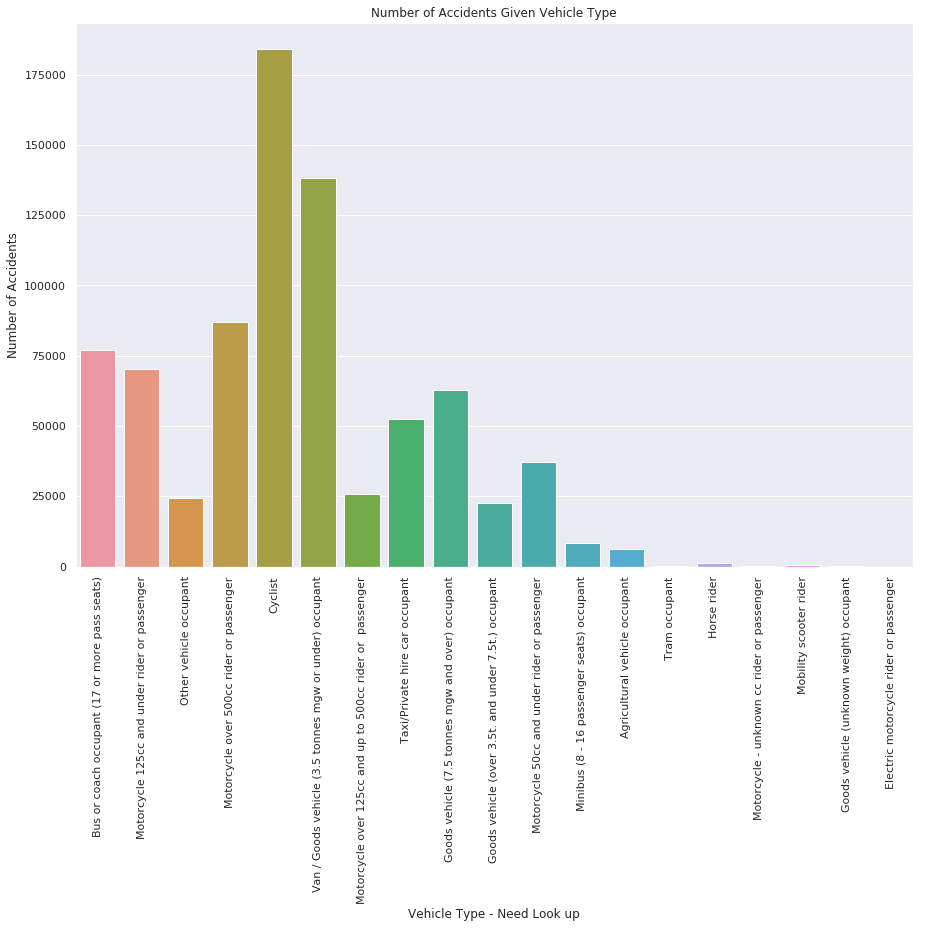

In [18]:
#cars=cars[cars["Vehicle_Type"]!=9]
plt.figure(figsize=(15,10))
sns.countplot(x="label",data=merged_vehicle[merged_vehicle['label']!='Car occupant'])
plt.xticks(rotation= 90)
plt.xlabel('Vehicle Type - Need Look up')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents Given Vehicle Type')

print(df2)

**So here we find cyclists are the second category in number of accidents, and unlike the cars that are very abundant, bikes are rare so this means they are really dangerous
Next up are trucks whcih aren't rare to come by and according to studies this is due to the fact that they are really hard to control in emergencies
Thirdly are motorcycles which are also very dangerous but are safer on highroads than bikes
after that there are buses and heavier trucks
Now the cars are the vehicles you'll see most often on the roads and that explains why they are 10x times any other vehicles**

In [19]:
people_age = casualties["Age_of_Casualty"].value_counts(dropna =False)
people_age.head()

18    77886
19    71876
20    68782
17    65660
21    61474
Name: Age_of_Casualty, dtype: int64

In [20]:
#Dividing the people age into 5 parts to be able to be drawn with the casuality type
people_age_first=[]
people_age_second=[]
people_age_third=[]
people_age_fourth=[]
people_age_fifth=[]
people_age.sort_values()
for i in range(len(people_age)):
    if (people_age.index[i] < 20 ):
        people_age_first.append(people_age.index[i])
    elif (20 < people_age.index[i] < 42):
        people_age_second.append(people_age.index[i])
    elif (42 < people_age.index[i] < 63):
        people_age_third.append(people_age.index[i])
    elif (63 < people_age.index[i] <84):
        people_age_fourth.append(people_age.index[i])
    else:
        people_age_fifth.append(people_age.index[i])        

In [21]:
len(people_age_first)

21

Text(0.5, 1.0, 'Number of Casualities given the Age')

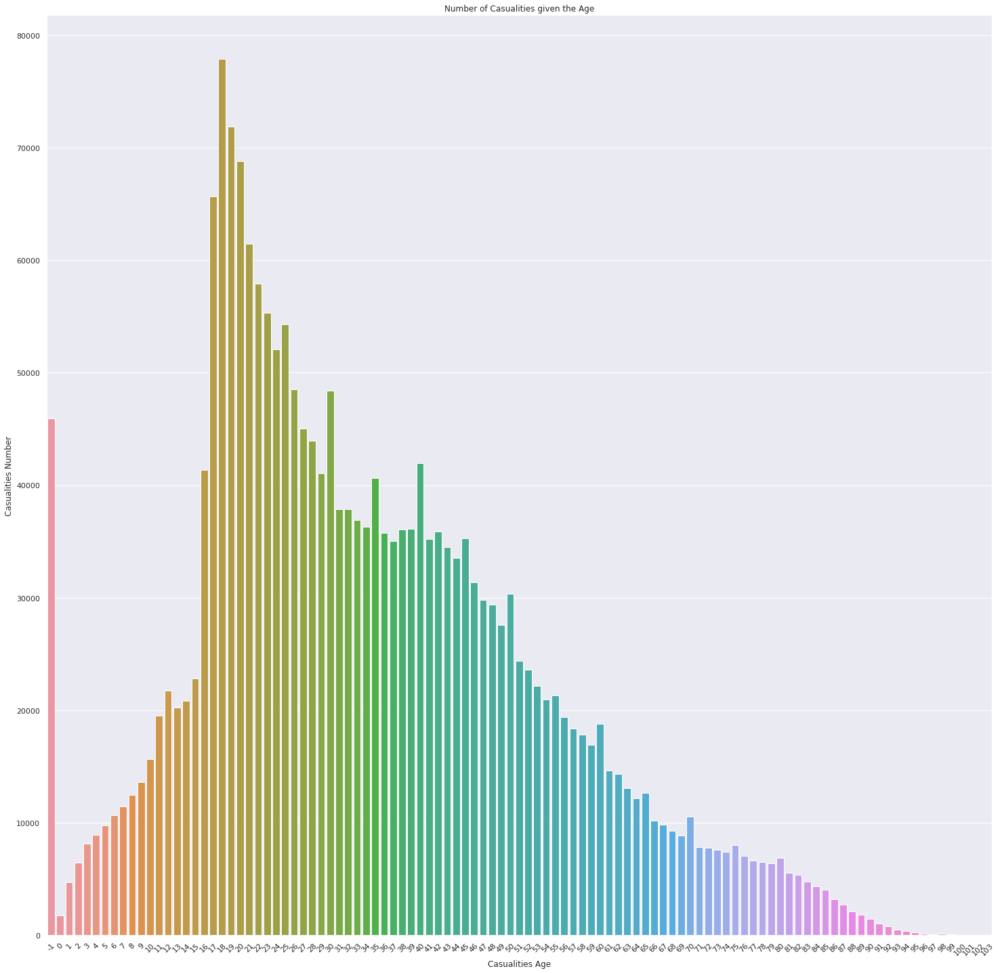

In [22]:
plt.figure(figsize=(25,25))
sns.barplot(x=people_age.index, y=people_age)
plt.xticks(rotation= 45)
plt.xlabel('Casualities Age')
plt.ylabel('Casualities Number')
plt.title('Number of Casualities given the Age')

#the maximum number of casualities occur at the age from 18-20

In [23]:
casuality_class = casualties["Casualty_Class"].value_counts(dropna =False)
casuality_class.head()

1    1398378
2     542477
3     275865
Name: Casualty_Class, dtype: int64

In [24]:
casualty_severity = casualties["Casualty_Severity"].value_counts(dropna = False)
casualty_severity.head()

3    1944238
2     249410
1      23072
Name: Casualty_Severity, dtype: int64

Text(0.5, 1.0, 'Casualities Class Vs Casuality Severity')

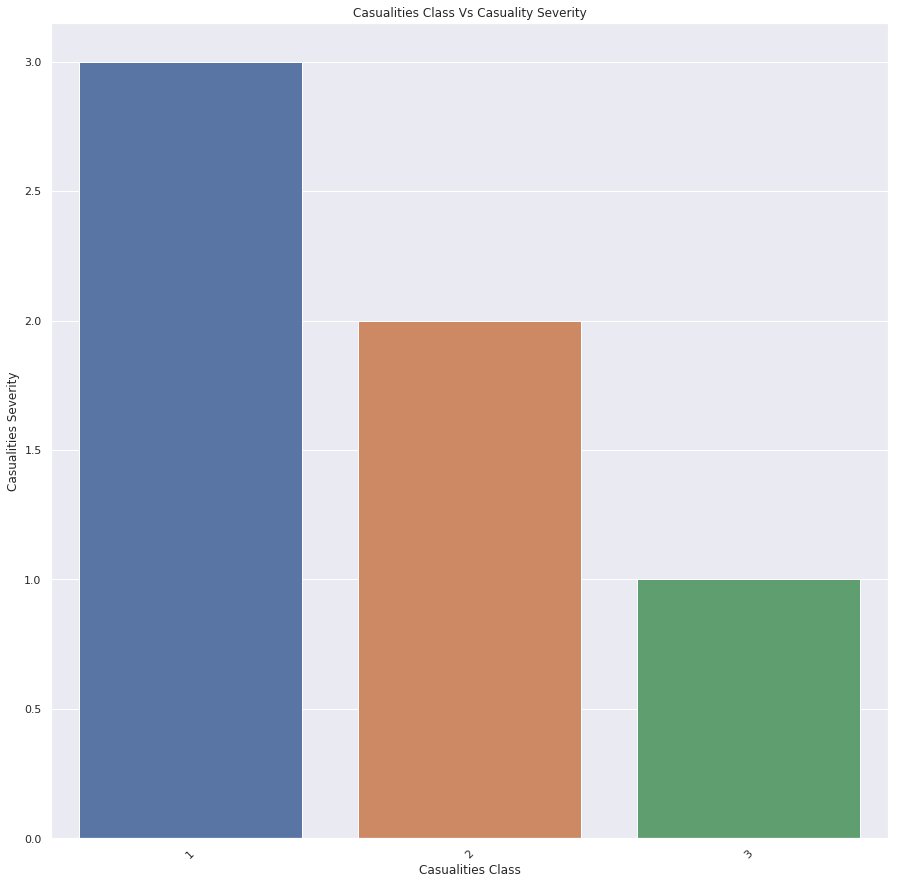

In [25]:
plt.figure(figsize=(15,15))
sns.barplot(x=casuality_class.index, y=casualty_severity.index)
plt.xticks(rotation= 45)
plt.xlabel('Casualities Class')
plt.ylabel('Casualities Severity')
plt.title('Casualities Class Vs Casuality Severity')

#Class Driver is the Fatal Severity 
#Class Passenger is the Serious Severity
#Class Pedestrians is the Slight Severity


In [26]:
casuality_type = casualties["Casualty_Type"].value_counts(dropna =False)
casuality_type.head()

9    1368829
0     275865
1     178529
5      85745
3      66291
Name: Casualty_Type, dtype: int64

Text(0.5, 1.0, 'Casualities Age Vs Casuality Type')

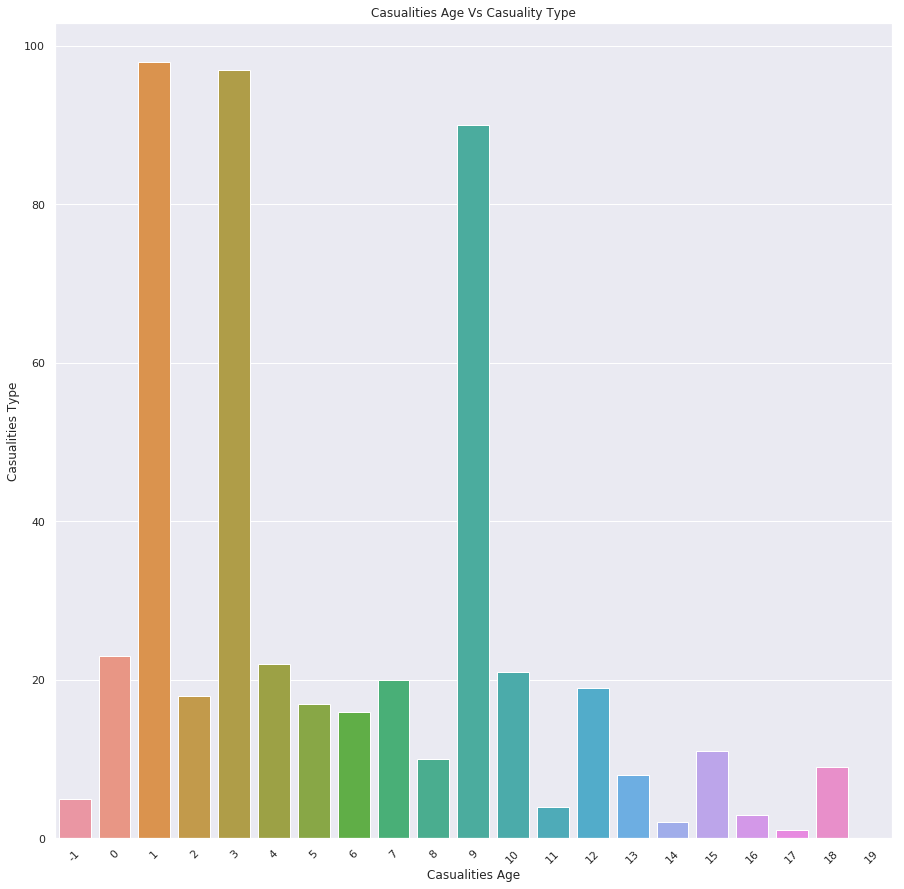

In [27]:
plt.figure(figsize=(15,15))
sns.barplot(x= people_age_first, y=casuality_type.index)
plt.xticks(rotation= 45)
plt.xlabel('Casualities Age')
plt.ylabel('Casualities Type')
plt.title('Casualities Age Vs Casuality Type')

#Age 0 -> baby who is just born died of electric motorcycle
#Age 1 -> Goods Vehicles of Unknown Weight
#Age 2 -> Tram Occupant
#Age 3 -> Motorcycle
#Age 4 -> Mobility Scooter Rider
#Age 5 

In [28]:
accidents.shape
accidents = accidents.dropna()
accidents.isnull().any()
accidents.head()

,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,...,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location
0,200501BS00001,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,2005-04-01,...,0,1,1,2,2,0,0,1,1,E01002849
1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,2005-05-01,...,0,5,4,1,1,0,0,1,1,E01002909
2,200501BS00003,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,2005-06-01,...,0,0,4,1,1,0,0,1,1,E01002857
3,200501BS00004,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,2005-07-01,...,0,0,1,1,1,0,0,1,1,E01002840
4,200501BS00005,528060.0,179040.0,-0.156618,51.495752,1,3,1,1,2005-10-01,...,0,0,7,1,2,0,0,1,1,E01002863


In [29]:
weather_lookup = pd.read_excel(lookup,"Weather")
weather_lookup

,code,label
0,1,Fine no high winds
1,2,Raining no high winds
2,3,Snowing no high winds
3,4,Fine + high winds
4,5,Raining + high winds
5,6,Snowing + high winds
6,7,Fog or mist
7,8,Other
8,9,Unknown
9,-1,Data missing or out of range


In [30]:
light_lookup = pd.read_excel(lookup,"Light Conditions")
light_lookup

,code,label
0,1,Daylight
1,4,Darkness - lights lit
2,5,Darkness - lights unlit
3,6,Darkness - no lighting
4,7,Darkness - lighting unknown
5,-1,Data missing or out of range


In [31]:
light_conditions = accidents[['Light_Conditions']]
weather_conditions = accidents[['Weather_Conditions']]
no_of_casualties = accidents["Number_of_Casualties"].value_counts(dropna =False)
weather_conditions.isnull().any()
light_conditions.columns

Index(['Light_Conditions'], dtype='object')

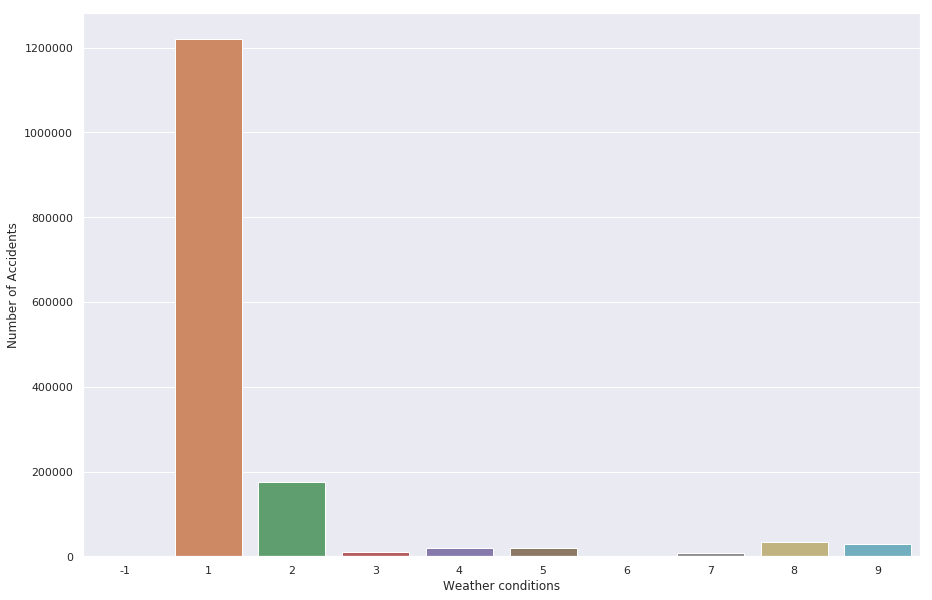

In [32]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,10))
plt.xticks(rotation= 0)
weatherplot = sns.countplot(x='Weather_Conditions',data=weather_conditions)
weatherplot.set(xlabel='Weather conditions', ylabel='Number of Accidents')
plt.show()

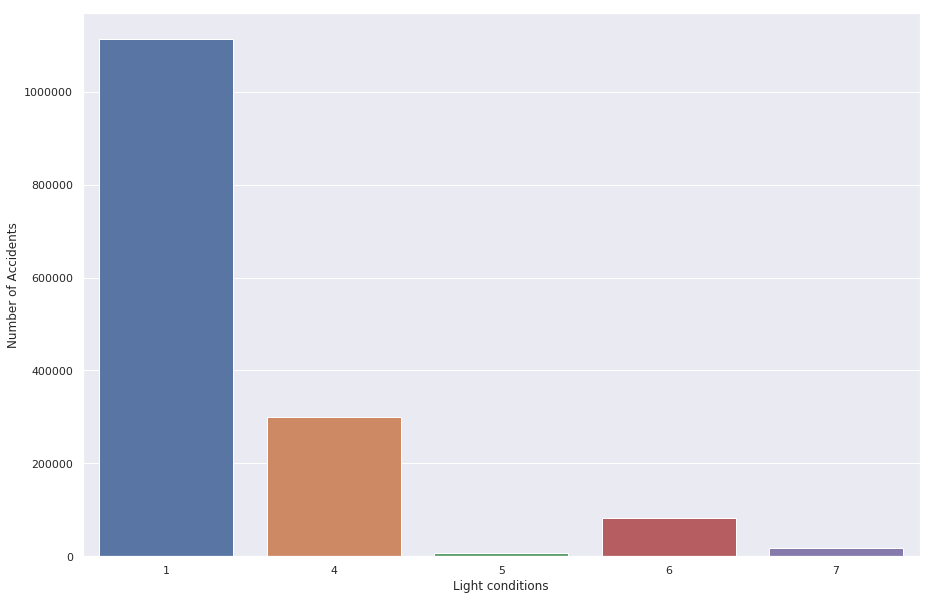

In [33]:
sns.set(style="darkgrid")
plt.figure(figsize=(15,10))
plt.xticks(rotation= 0)
weatherplot = sns.countplot(x='Light_Conditions',data=light_conditions)
weatherplot.set(xlabel='Light conditions', ylabel='Number of Accidents')
plt.show()

In [34]:
data_frame_conditions = accidents[['Light_Conditions','Weather_Conditions']]
data_frame_conditions.columns

Index(['Light_Conditions', 'Weather_Conditions'], dtype='object')

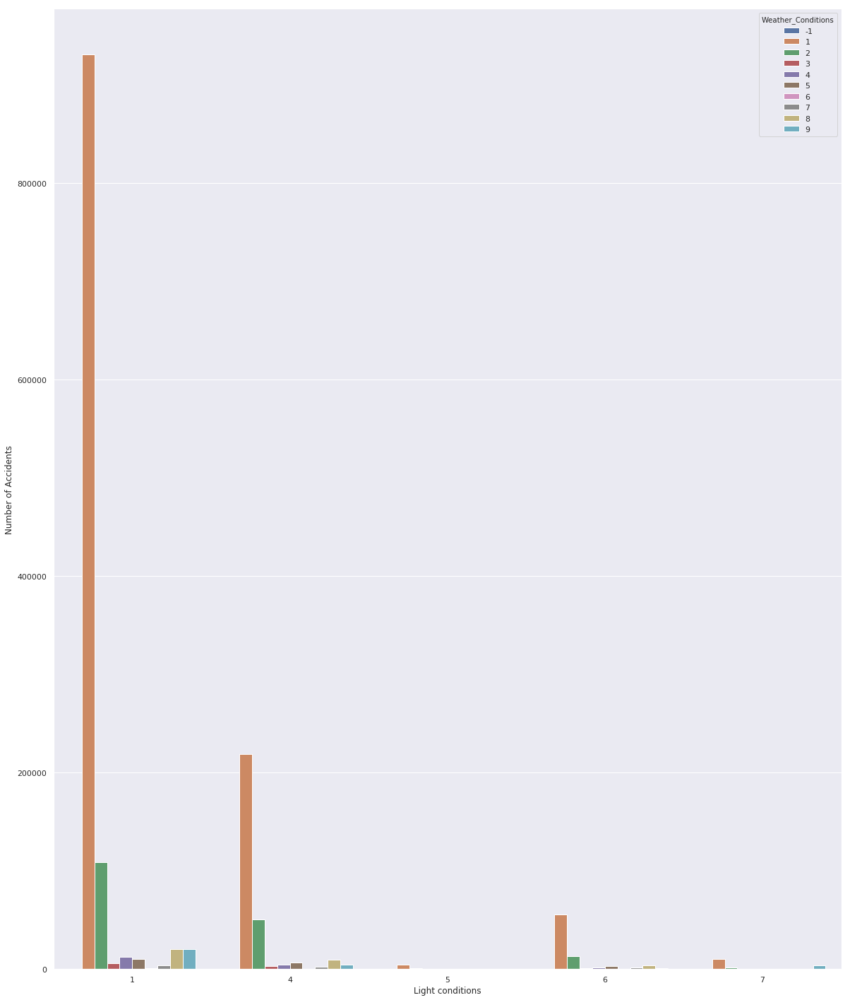

In [35]:
sns.set(style="darkgrid")
plt.figure(figsize=(20,25))
plt.xticks(rotation= 0)
weatherplot = sns.countplot(x='Light_Conditions',data=data_frame_conditions,hue="Weather_Conditions")
weatherplot.set(xlabel='Light conditions', ylabel='Number of Accidents')
plt.show()

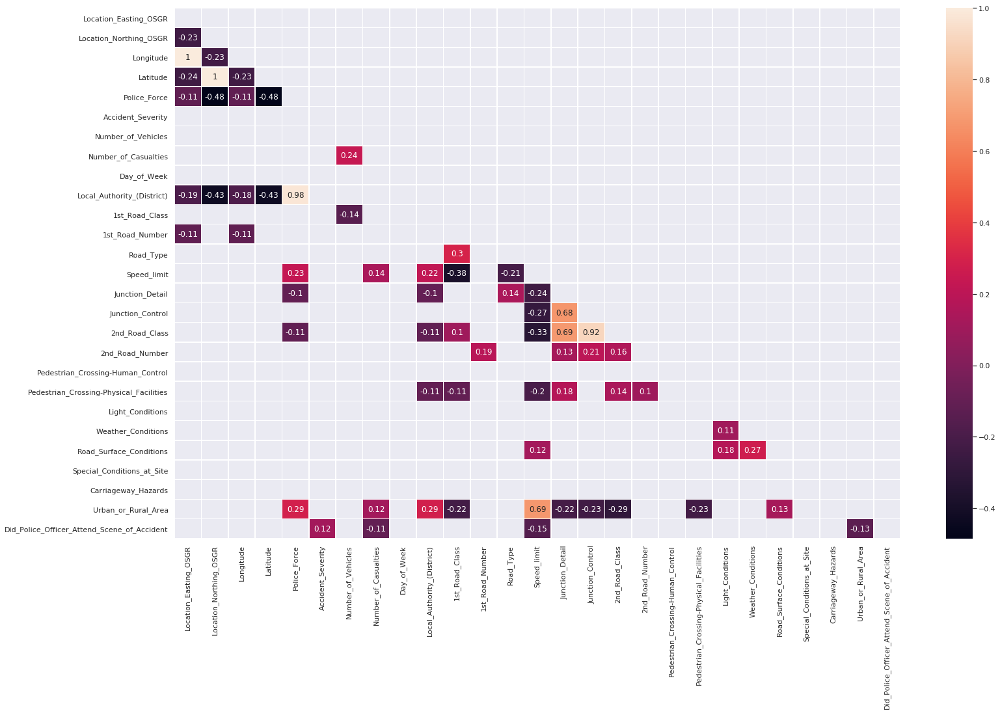

In [36]:
plt.figure(figsize=(25,15))
corr=accidents.corr()
corr[abs(corr) <= 0.1]=None
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(corr, linewidths=.5,annot=True,mask=mask)

In [37]:
urban_rural = accidents[['Urban_or_Rural_Area','Speed_limit','Road_Surface_Conditions']]
urban_rural.head()

,Urban_or_Rural_Area,Speed_limit,Road_Surface_Conditions
0,1,30,2
1,1,30,1
2,1,30,1
3,1,30,1
4,1,30,2


In [38]:
area_lookup = pd.read_excel(lookup,"Urban Rural")
area_lookup
merged_urban = pd.merge(urban_rural, area_lookup, left_on='Urban_or_Rural_Area', right_on='code')
merged_urban

,Urban_or_Rural_Area,Speed_limit,Road_Surface_Conditions,code,label
0,1,30,2,1,Urban
1,1,30,1,1,Urban
2,1,30,1,1,Urban
3,1,30,1,1,Urban
4,1,30,2,1,Urban
...,...,...,...,...,...
1519993,2,60,2,2,Rural
1519994,2,60,1,2,Rural
1519995,2,60,2,2,Rural
1519996,2,40,2,2,Rural


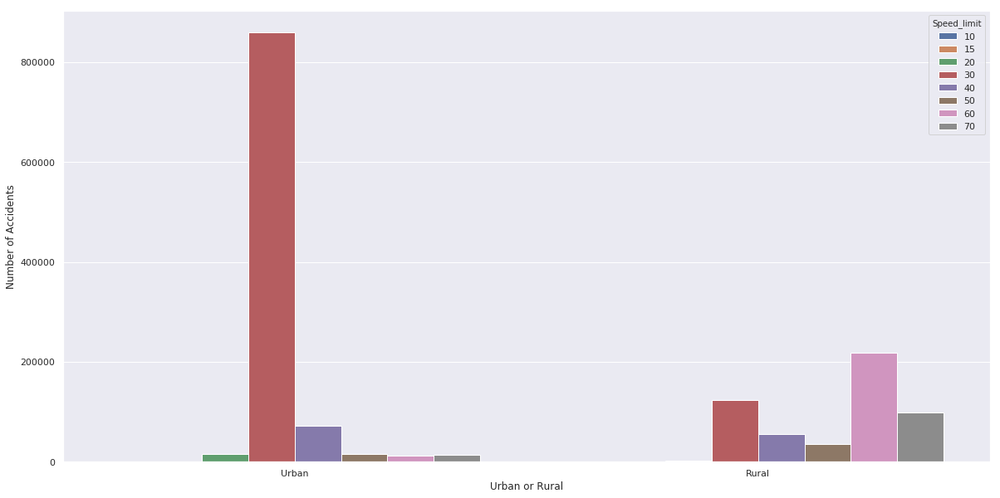

In [39]:
sns.set(style="darkgrid")
plt.figure(figsize=(20,10))
plt.xticks(rotation= 0)
weatherplot = sns.countplot(x='label',data=merged_urban,hue="Speed_limit")
weatherplot.set(xlabel='Urban or Rural', ylabel='Number of Accidents')
plt.show()

In [40]:
from datetime import datetime
ts = accidents['Date']
ts_df= ts.value_counts().sort_index().rename_axis('ds').reset_index(name='y')

# Model Testing

# Model

In [41]:
from fbprophet import Prophet
m = Prophet()
m.fit(ts_df)

In [42]:
#1 year feature prediction
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
4012,2015-12-27,244.258497,155.994593,337.406115
4013,2015-12-28,304.456042,212.955460,391.084622
4014,2015-12-29,311.864978,221.912421,403.383618
4015,2015-12-30,317.523113,229.467437,400.356177
4016,2015-12-31,318.056093,227.285930,409.604128


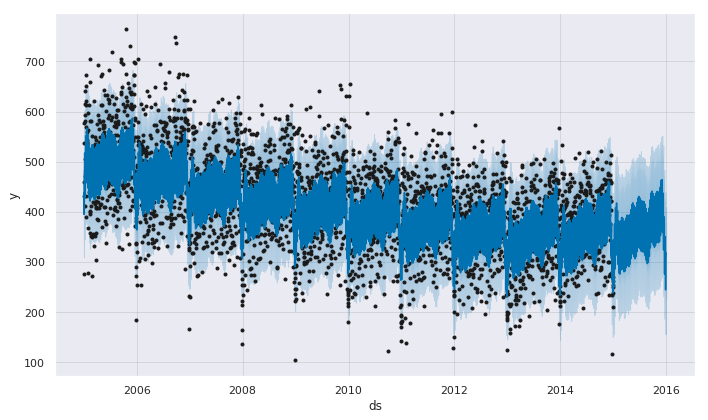

In [43]:
fig1 =m.plot(forecast)

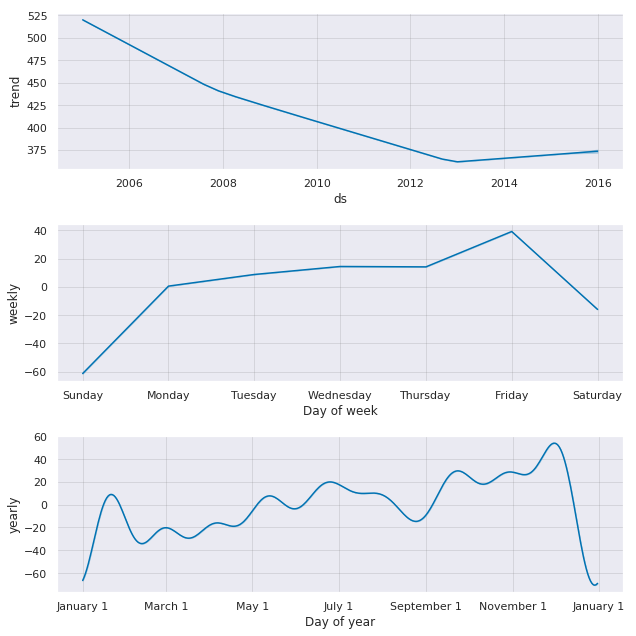

In [44]:
fig2 = m.plot_components(forecast)

# Model Accuracy Metrics

In [45]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


# Train Set

In [46]:
print("Train MSE: %0.2f"%mean_squared_error(ts_df.y,forecast[:4017-365].yhat))
print("Train R2: %0.2f"%r2_score(ts_df.y,forecast[:4017-365].yhat))
print("Train MAE: %0.2f"%mean_absolute_error(ts_df.y,forecast[:4017-365].yhat))

Train MSE: 4942.20
Train R2: 0.42
Train MAE: 53.50


# Test Set

In [47]:
m_test = Prophet()
m_test.fit(ts_df[:-2000])
future_test = m_test.make_future_dataframe(periods=2000)
forecast_test = m_test.predict(future_test)

In [48]:
print("Test MSE: %0.2f"%mean_squared_error(ts_df[-2000:].y,forecast_test[-2000:].yhat))
print("Test R2: %0.2f"%r2_score(ts_df[-2000:].y,forecast_test[-2000:].yhat))
print("Test MAE: %0.2f"%mean_absolute_error(ts_df[-2000:].y,forecast_test[-2000:].yhat))

Test MSE: 5012.40
Test R2: 0.17
Test MAE: 53.66


In [49]:
for i in range(11):
    print(np.average(ts_df[365*i:365*i+365].y),np.std(ts_df[365*i:365*i+365].y))
    

507.3150684931507 91.78878027242449
482.53150684931506 88.4549709401952
441.6027397260274 79.66263449673038
432.8986301369863 77.69778560895047
415.9808219178082 82.32260073093704
394.9397260273973 81.6816519021205
387.52876712328765 77.20502765843874
371.7808219178082 71.691241813412
353.1232876712329 73.83816906660827
375.3808219178082 67.50111243636191
236.5 25.5
